In [32]:
!pip install nltk
import nltk; nltk.download('stopwords')
from nltk.tokenize import word_tokenize
import string
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
!pip install pyldavis
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

from wordcloud import WordCloud

You should consider upgrading via the '/Users/cbeams/.pyenv/versions/3.8.12/envs/objectively_funny/bin/python -m pip install --upgrade pip' command.


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/cbeams/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


You should consider upgrading via the '/Users/cbeams/.pyenv/versions/3.8.12/envs/objectively_funny/bin/python -m pip install --upgrade pip' command.


In [2]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

In [5]:
# Import Dataset
df = pd.read_json('../raw_data/all_data_df_stripped.json')
df.head()

,full_transcript,artist,show_name,year,source,artist_birthday,artist_gender,age_then,full_transcript_clean
0,[rock music playing]\n\n[indistinct chatter]\n...,Adam Devine,Best Time Of Our Lives,2019.0,Scraps from the Loft,1983.0,2,36.0,man guy much seat guy jacked fully juiced man ...
1,"strong language. CHEERING Yes, yes, yes! How...",Adam Hess,Live from the BBC,2016.0,BBC,1990.0,2,26.0,yes yes yes lovely apologise state voice go co...
2,"Ladies and gentlemen, please welcome your hos...",Adam Hills,Live at the Apollo Series 9 Episode 4,2013.0,BBC,1970.0,2,43.0,tonight london london live amazing act present...
3,some strong language and adult humour Ladies...,Adam Hills,Live at the Apollo Series 12 Episode 4,2016.0,BBC,1970.0,2,46.0,tonight hair lost bet british paralympic team ...
4,"? CHEERING Hello, Apollo. I am going to start ...",Adam Hills,Live at the Apollo Series 5 Episode 5,2009.0,BBC,1970.0,2,39.0,start saying something probably never heard co...


In [6]:
# Convert to list
data = df.full_transcript_clean.values.tolist()

pprint(data[:1])

['man guy much seat guy jacked fully juiced man excited guy blast tonight '
 'excited excited though adult man excited lock littlekidlevel geeked remember '
 'kid open present vocabulary much mama however guy talked weirdo thing mama '
 'much mama vocabulary go like face adult lock adultass thing kid school drop '
 'enjoy lunch today made ham cheese question quality meat made littlekidlevel '
 'excited face month child swear mom gave super bouncy ball birthday guy poor '
 'parent cool gave bouncy ball month straight driveway like snatched midair '
 'phrase use youth midair nothing midair adult child caught midair mom soaring '
 'abyss snatched midair midair mom midair midair midair mom jesus christ '
 'course caught midair honey anything catch air would technically midair '
 'caught ground called picking fuck idiot dumb little boy kids– cool kid still '
 'getting level geeked still getting fully geeked elevator long ago big deal '
 'fuck stair stupid stupid elevator crappy day adult we

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['man', 'guy', 'much', 'seat', 'guy', 'jacked', 'fully', 'juiced', 'man', 'excited', 'guy', 'blast', 'tonight', 'excited', 'excited', 'though', 'adult', 'man', 'excited', 'lock', 'littlekidlevel', 'geeked', 'remember', 'kid', 'open', 'present', 'vocabulary', 'much', 'mama', 'however', 'guy', 'talked', 'weirdo', 'thing', 'mama', 'much', 'mama', 'vocabulary', 'go', 'like', 'face', 'adult', 'lock', 'adultass', 'thing', 'kid', 'school', 'drop', 'enjoy', 'lunch', 'today', 'made', 'ham', 'cheese', 'question', 'quality', 'meat', 'made', 'littlekidlevel', 'excited', 'face', 'month', 'child', 'swear', 'mom', 'gave', 'super', 'bouncy', 'ball', 'birthday', 'guy', 'poor', 'parent', 'cool', 'gave', 'bouncy', 'ball', 'month', 'straight', 'driveway', 'like', 'snatched', 'midair', 'phrase', 'use', 'youth', 'midair', 'nothing', 'midair', 'adult', 'child', 'caught', 'midair', 'mom', 'soaring', 'abyss', 'snatched', 'midair', 'midair', 'mom', 'midair', 'midair', 'midair', 'mom', 'jesus', 'christ', 'cours

In [8]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=5) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=5)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['man', 'guy', 'much', 'seat', 'guy', 'jacked', 'fully', 'juiced', 'man', 'excited', 'guy', 'blast', 'tonight', 'excited_excited', 'though', 'adult', 'man', 'excited', 'lock', 'littlekidlevel', 'geeked', 'remember', 'kid', 'open', 'present', 'vocabulary', 'much', 'mama', 'however', 'guy', 'talked', 'weirdo', 'thing', 'mama', 'much', 'mama', 'vocabulary', 'go', 'like', 'face', 'adult', 'lock', 'adultass', 'thing', 'kid_school', 'drop', 'enjoy', 'lunch', 'today', 'made', 'ham', 'cheese', 'question', 'quality', 'meat', 'made', 'littlekidlevel', 'excited', 'face', 'month', 'child', 'swear', 'mom', 'gave', 'super', 'bouncy', 'ball', 'birthday', 'guy', 'poor', 'parent', 'cool', 'gave', 'bouncy', 'ball', 'month', 'straight', 'driveway', 'like', 'snatched', 'midair', 'phrase_use', 'youth', 'midair', 'nothing', 'midair', 'adult', 'child', 'caught', 'midair', 'mom', 'soaring', 'abyss', 'snatched', 'midair', 'midair', 'mom', 'midair', 'midair', 'midair', 'mom', 'jesus_christ', 'course', 'caught',

In [9]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [10]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

[['guy', 'much', 'seat', 'guy', 'jack', 'fully', 'juiced', 'man', 'excited', 'guy', 'blast', 'tonight', 'excited_excite', 'adult', 'man', 'excite', 'lock', 'littlekidlevel', 'geeke', 'remember', 'kid', 'open', 'present', 'vocabulary', 'much', 'however', 'talk', 'thing', 'much', 'vocabulary', 'go', 'face', 'adult', 'lock', 'adultass', 'thing', 'kid', 'school', 'drop', 'enjoy', 'lunch', 'today', 'make', 'ham', 'cheese', 'question', 'quality', 'meat', 'make', 'littlekidlevel', 'excited', 'face', 'month', 'child', 'swear', 'mom', 'give', 'super', 'bouncy', 'ball', 'birthday', 'guy', 'poor', 'parent', 'give', 'bouncy', 'ball', 'month', 'straight', 'driveway', 'snatch', 'youth', 'adult', 'child', 'catch', 'mom', 'soar', 'abyss', 'snatch', 'midair', 'mom', 'mom', 'course', 'catch', 'midair', 'honey', 'catch', 'air', 'technically', 'midair', 'catch', 'ground', 'call', 'pick', 'fuck', 'idiot', 'dumb', 'kid', 'cool', 'kid', 'still', 'get', 'level', 'geeke', 'still', 'get', 'fully', 'geeke', 'ele

In [11]:
def remove_stopw(text, word_list):
    for i in range(len(text)):
        text[i] = [w for w in text[i] if not w in word_list]
    return text

In [56]:
### additional words to remove from the scripts
words_to_remove = ['thank', 'cheering', 'recorded', 'applause', 'laughter', 'laughing', 'murmuring', 'chatter',
                       'aired', 'filmed', 'ladies', 'gentlemen', 'welcome', 'stage', 'transcript', 'netflix',
                  'apollo', 'like', 'goodnight', 'mutter', 'noo', 'nuh', 'oof', 'maan', 'cause', 'okay', 
                   'hey', 'also', 'someone', 'somebody', 'everybody', 'also', 'part' , 'sometimes', 'maybe', 
                   'three', 'second', 'everything', 'minute', 'name', 'kind', 'point', 'yeah', 'hello', 'one', 
                   'two', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'whine', 'hnn', 'malla', 'letta', 
                   'namoo', 'getta', 'nama', 'mana', 'chk','manoo', 'hadda', 'ama', 'carlin',
                  'go', 'know', 'host', 'goodnight', 'get', 'gon', 'think', 'say', 'right', 'look',
                  'thing', 'make', 'know', 'want', 'going', 'would', 'could', 'gentlemen', 'let', 'please',
                   'hbo', 'special' 'yes', 'take', 'say', 'got', 'come', 'see', 'really', 'tell',
                   'well', 'give', 'said', 'people', 'mean', 'even', 'never', 'way', 'happen', 'put', 'much',
                  'lot', 'ever', 'still', 'live', 'quite', 'sort', 'actually', 'use', 'tonight', 'find', 'always',
                  'time', 'good', 'back', 'show', 'little', 'big', 'day', 'talk', 'start', 'need', 'bad', 'first', 'great',
                  'try', 'year', 'word', 'turn', 'bring', 'feel', 'bit', 'ck', 'cke', 'gger', 'ckin']
                    
                    # 'know'? 'go'? 'fuck'?
    
                    # haven't left 'i'm' etc. as those should be cleaned up
                    # by a mixture of stopwords, punctuation removeal, lemmatizing and minimum length

remove_stopw(data_lemmatized, stopwords.words('english'))
remove_stopw(data_lemmatized, words_to_remove)

[['guy',
  'seat',
  'guy',
  'jack',
  'fully',
  'juiced',
  'man',
  'excited',
  'guy',
  'blast',
  'excited_excite',
  'adult',
  'man',
  'excite',
  'lock',
  'littlekidlevel',
  'geeke',
  'remember',
  'kid',
  'open',
  'present',
  'vocabulary',
  'however',
  'vocabulary',
  'face',
  'adult',
  'lock',
  'adultass',
  'kid',
  'school',
  'drop',
  'enjoy',
  'lunch',
  'today',
  'ham',
  'cheese',
  'question',
  'quality',
  'meat',
  'littlekidlevel',
  'excited',
  'face',
  'month',
  'child',
  'swear',
  'mom',
  'super',
  'bouncy',
  'ball',
  'birthday',
  'guy',
  'poor',
  'parent',
  'bouncy',
  'ball',
  'month',
  'straight',
  'driveway',
  'snatch',
  'youth',
  'adult',
  'child',
  'catch',
  'mom',
  'soar',
  'abyss',
  'snatch',
  'midair',
  'mom',
  'mom',
  'course',
  'catch',
  'midair',
  'honey',
  'catch',
  'air',
  'technically',
  'midair',
  'catch',
  'ground',
  'call',
  'pick',
  'fuck',
  'idiot',
  'dumb',
  'kid',
  'cool',
  'kid

In [57]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 9), (1, 1), (2, 1), (3, 1), (4, 1), (5, 4), (6, 1), (7, 1), (8, 1), (9, 3), (10, 1), (11, 10), (12, 2), (13, 1), (14, 1), (15, 1), (16, 1), (17, 6), (18, 2), (19, 1), (20, 1), (21, 2), (22, 2), (23, 1), (24, 2), (25, 1), (26, 2), (27, 1), (28, 1), (29, 1), (30, 1), (31, 3), (32, 8), (33, 1), (34, 2), (35, 1), (36, 3), (37, 2), (38, 1), (39, 8), (40, 1), (41, 5), (42, 3), (43, 1), (44, 1), (45, 1), (46, 3), (47, 5), (48, 1), (49, 4), (50, 1), (51, 3), (52, 1), (53, 1), (54, 1), (55, 1), (56, 2), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 2), (63, 2), (64, 1), (65, 1), (66, 2), (67, 1), (68, 7), (69, 13), (70, 1), (71, 2), (72, 1), (73, 1), (74, 1), (75, 2), (76, 1), (77, 2), (78, 7), (79, 1), (80, 1), (81, 1), (82, 1), (83, 5), (84, 7), (85, 2), (86, 1), (87, 3), (88, 1), (89, 1), (90, 7), (91, 1), (92, 1), (93, 1), (94, 2), (95, 1), (96, 2), (97, 1), (98, 1), (99, 1), (100, 1), (101, 3), (102, 8), (103, 1), (104, 1), (105, 1), (106, 9), (107, 7), (108, 3), (109, 1), (110, 

In [58]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=31,
                                            random_state=100,
                                            update_every=1,
                                            chunksize=190,
                                            passes=10,
                                            alpha=0.4,
                                            eta=0.5,
                                            per_word_topics=True)

In [59]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(3,
  '0.000*"doublevodka" + 0.000*"groan_low" + 0.000*"low_groan" + '
  '0.000*"groan_high" + 0.000*"ahahaha" + 0.000*"hawkward" + '
  '0.000*"blahblahblah" + 0.000*"hypnotist" + 0.000*"badoom" + '
  '0.000*"rockclimbe"'),
 (19,
  '0.010*"guy" + 0.006*"man" + 0.006*"love" + 0.005*"woman" + 0.005*"work" + '
  '0.005*"fuck" + 0.005*"call" + 0.004*"kid" + 0.004*"life" + 0.003*"friend"'),
 (5,
  '0.000*"doublevodka" + 0.000*"groan_low" + 0.000*"low_groan" + '
  '0.000*"groan_high" + 0.000*"ahahaha" + 0.000*"hawkward" + '
  '0.000*"blahblahblah" + 0.000*"badoom" + 0.000*"hypnotist" + '
  '0.000*"rockclimbe"'),
 (1,
  '0.002*"southend" + 0.002*"drummer" + 0.001*"game_throne" + '
  '0.001*"carpet_remnant" + 0.001*"deacon_blue" + 0.001*"drummer_coldplay" + '
  '0.001*"gentrification" + 0.001*"sheffield" + 0.001*"metropolitan_liberal" + '
  '0.001*"coldplay"'),
 (24,
  '0.000*"beautiful_british" + 0.000*"baconreceptor" + 0.000*"asthma" + '
  '0.000*"spudface" + 0.000*"chassis" + 0.000*"fitful

In [60]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -8.388703801200144

Coherence Score:  0.2570613892907486


In [61]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds='mmds')
vis

/Users/cbeams/.pyenv/versions/3.8.12/envs/objectively_funny/lib/python3.8/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.305460  0.117470       1        1  70.943684
8     -0.314340 -0.087660       2        1  27.629672
17     0.021769 -0.008056       3        1   0.197729
1      0.030478 -0.006936       4        1   0.176320
21     0.019016 -0.002358       5        1   0.112531
6      0.023805  0.002795       6        1   0.108208
16     0.021256  0.000372       7        1   0.070205
23     0.021092 -0.000957       8        1   0.039584
2      0.021604 -0.000844       9        1   0.039559
9      0.020893 -0.000458      10        1   0.036770
27     0.021047 -0.000519      11        1   0.036354
24     0.020857 -0.000576      12        1   0.035376
26     0.020953 -0.000620      13        1   0.031861
29     0.020946 -0.000647      14        1   0.030120
12     0.020946 -0.000647      15        1   0.030119
7      0.020946 -0.000647      16        1   0.030119
4      0.020946 -0.000647      17        1   0.030119
25     0.020946 -0.000647      18        1   0.030119
3      0.020946 -0.000647      19        1   0.030119
5      0.020946 -0.000647      20        1   0.030119
20     0.020946 -0.000647      21        1   0.030119
14     0.020946 -0.000647      22        1   0.030119
28     0.020946 -0.000647      23        1   0.030119
11     0.020946 -0.000647      24        1   0.030119
15     0.020946 -0.000647      25        1   0.030119
0      0.020946 -0.000647      26        1   0.030119
30     0.020946 -0.000647      27        1   0.030119
10     0.020946 -0.000647      28        1   0.030119
18     0.020946 -0.000647      29        1   0.030119
13     0.020946 -0.000647      30        1   0.030119
22     0.020946 -0.000647      31        1   0.030119, topic_info=                 Term         Freq        Total Category  logprob  loglift
670              shit  6819.000000  6819.000000  Default  30.0000  30.0000
312              fuck  7556.000000  7556.000000  Default  29.0000  29.0000
471               man  7358.000000  7358.000000  Default  28.0000  28.0000
313           fucking  3876.000000  3876.000000  Default  27.0000  27.0000
505      motherfucker  1348.000000  1348.000000  Default  26.0000  26.0000
...               ...          ...          ...      ...      ...      ...
32688    blahblahblah     0.006202     3.738996  Topic31 -10.5202   1.7060
32288  aromatherapist     0.006195     2.395372  Topic31 -10.5213   2.1502
32289       cataholic     0.006195     2.395372  Topic31 -10.5213   2.1502
32290          deform     0.006195     2.395372  Topic31 -10.5213   2.1502
32292      merseyside     0.006195     2.395372  Topic31 -10.5213   2.1502

[2262 rows x 6 columns], token_table=       Topic      Freq           Term
term                                 
11328      1  0.730248    aaaaaaarhhh
11328      2  0.730248    aaaaaaarhhh
2927       1  0.753221  accountanttax
32696      1  0.569781     actionable
32696      2  0.569781     actionable
...      ...       ...            ...
33617      1  0.837030       yeargirl
3237       1  0.752761         yesyou
3096       1  0.639516            zey
3537       1  0.252843      zookeeper
3537       2  0.758529      zookeeper

[894 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 9, 18, 2, 22, 7, 17, 24, 3, 10, 28, 25, 27, 30, 13, 8, 5, 26, 4, 6, 21, 15, 29, 12, 16, 1, 31, 11, 19, 14, 23])

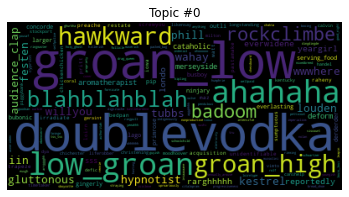

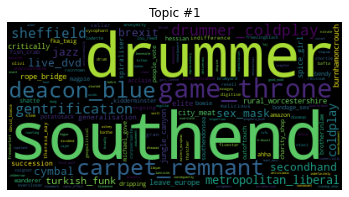

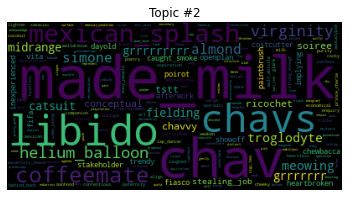

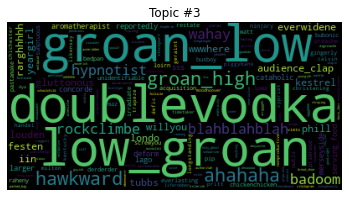

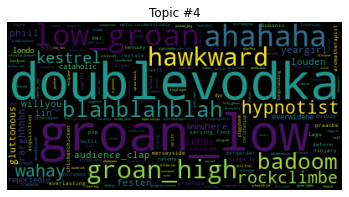

...

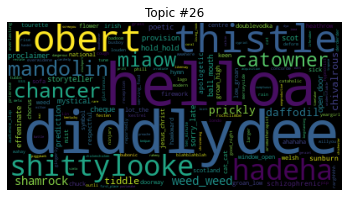

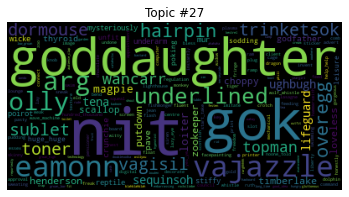

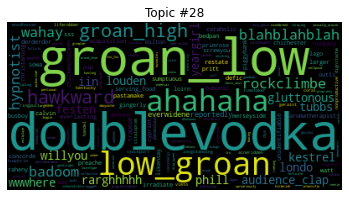

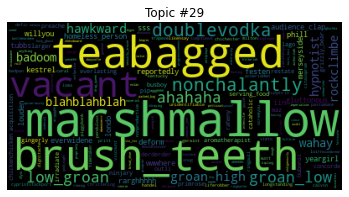

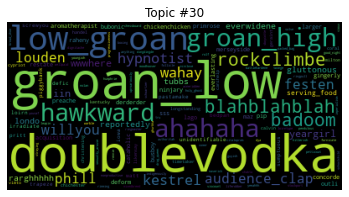

In [62]:
# lda is assumed to be the variable holding the LdaModel object
import matplotlib.pyplot as plt
for t in range(lda_model.num_topics):
    plt.figure()
    plt.imshow(WordCloud().fit_words(dict(lda_model.show_topic(t, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()